In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import precision_recall_fscore_support, mean_absolute_error
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv(r'https://raw.githubusercontent.com/sharmapratik88/AIML-Projects/master/04_Unsupervised%20Learning/vehicle.csv')

In [3]:
df.shape

(846, 19)

In [4]:
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [5]:
df.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

In [6]:
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [7]:
df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [8]:
df.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [10]:
df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [11]:
df[df.duplicated()].shape[0]

0

In [12]:
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [13]:
df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [14]:
for i in df.columns:
    if i != 'class':
        df[i] = df[i].fillna(df[i].median())

In [15]:
df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [16]:
df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

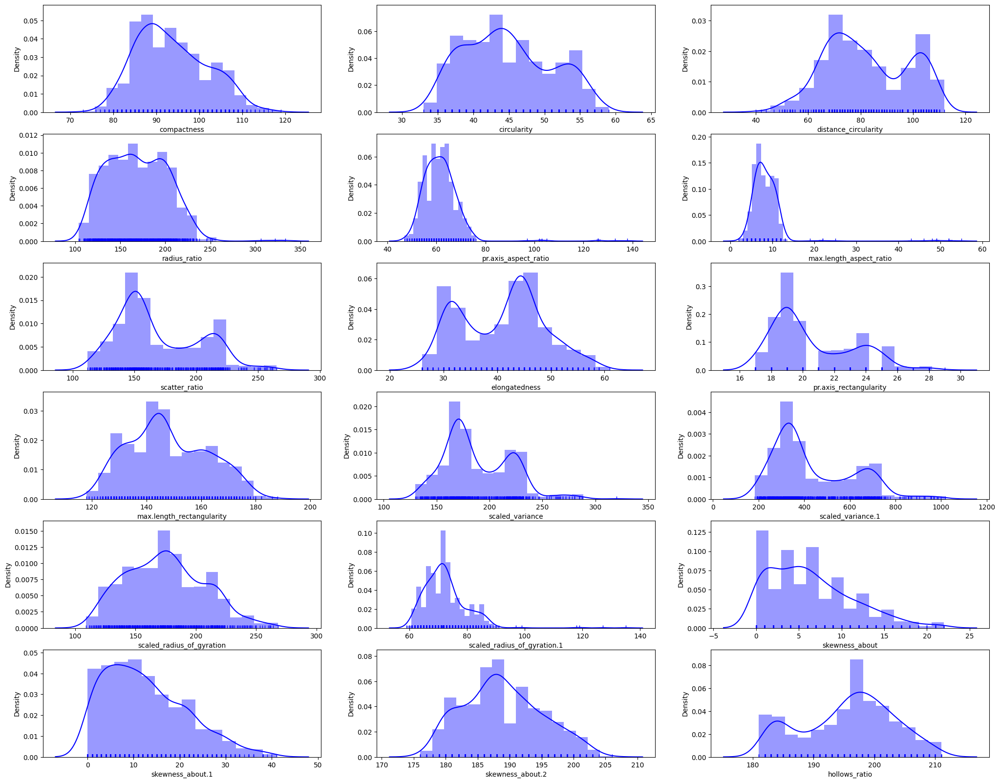

In [17]:
plt.figure(figsize = (25,20))
col = 1
for i in  df.drop(columns = 'class').columns:
    plt.subplot(6,3,col)
    sns.distplot(df[i], color = 'b', rug = True)
    col +=1

class
car    429
bus    218
van    199
Name: count, dtype: int64


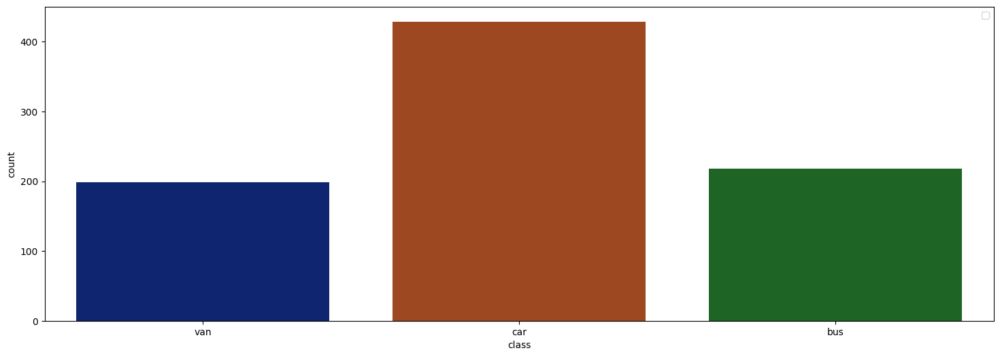

In [18]:
print(df['class'].value_counts())
plt.figure(figsize = (18,6))
sns.countplot(data = df, x = 'class', palette = 'dark')
plt.legend()
plt.show()

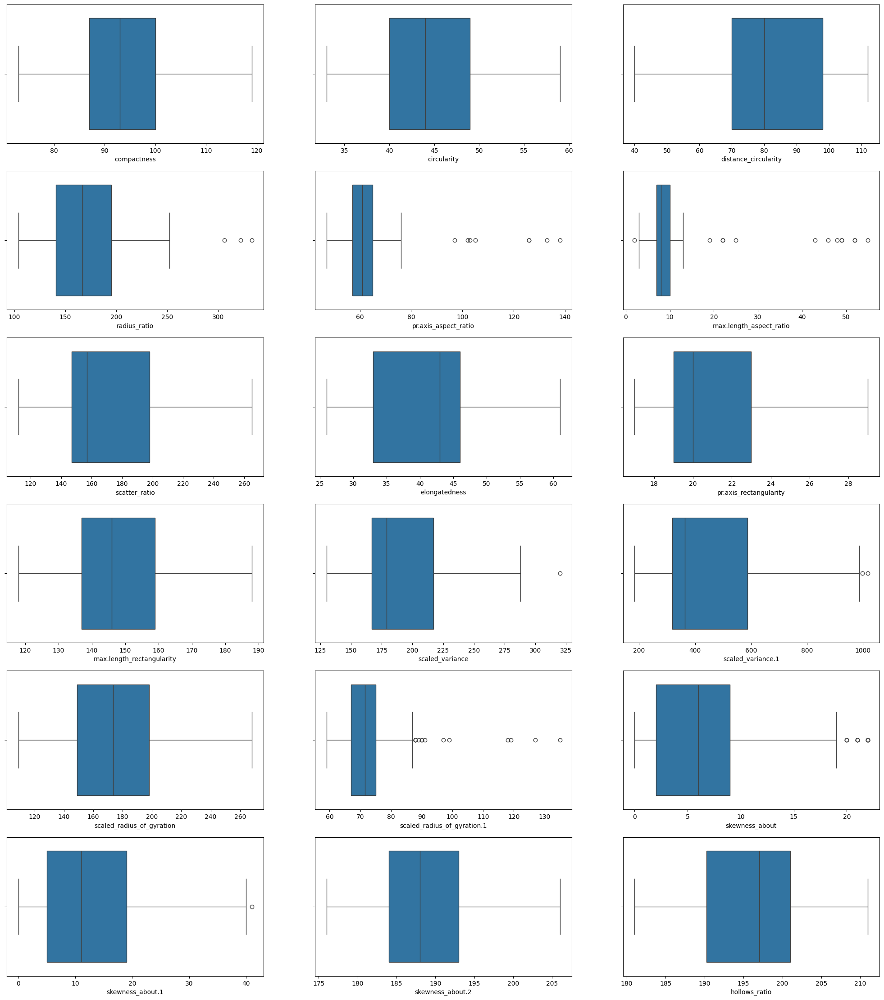

In [19]:
plt.figure(figsize = (25,28))
col = 1 
for i in df.drop(columns = 'class').columns:
    plt.subplot(6,3,col)
    sns.boxplot(df[i], orient = 'h')
    col += 1

{'whiskers': [<matplotlib.lines.Line2D at 0x1ddc03c5c10>,
 'caps': [<matplotlib.lines.Line2D at 0x1ddc03c6f50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1ddc03c5410>],
 'medians': [<matplotlib.lines.Line2D at 0x1ddc03d4050>],
 'fliers': [<matplotlib.lines.Line2D at 0x1ddc03d4890>],
 'means': []}

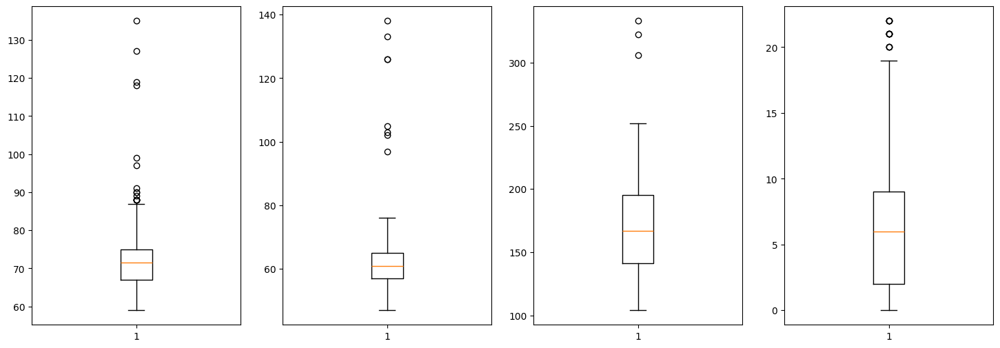

In [20]:
plt.figure(figsize = (18,6))

plt.subplot(1,4,1)
plt.boxplot(df['scaled_radius_of_gyration.1'])

plt.subplot(1,4,2)
plt.boxplot(df['pr.axis_aspect_ratio'])

plt.subplot(1,4,3)
plt.boxplot(df['radius_ratio'])

plt.subplot(1,4,4)
plt.boxplot(df['skewness_about'])

In [21]:
for i in df.drop(columns = 'class').columns:
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3 - Q1

    low = Q1 - 1.5 * IQR
    high = Q3 + 1.5 * IQR
    df.loc[(df[i] < low) | (df[i] > high), i] = df[i].median()
    #df.loc[(df[i] < low) | (df[i] > high), i] = df[i].median()

In [22]:
df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

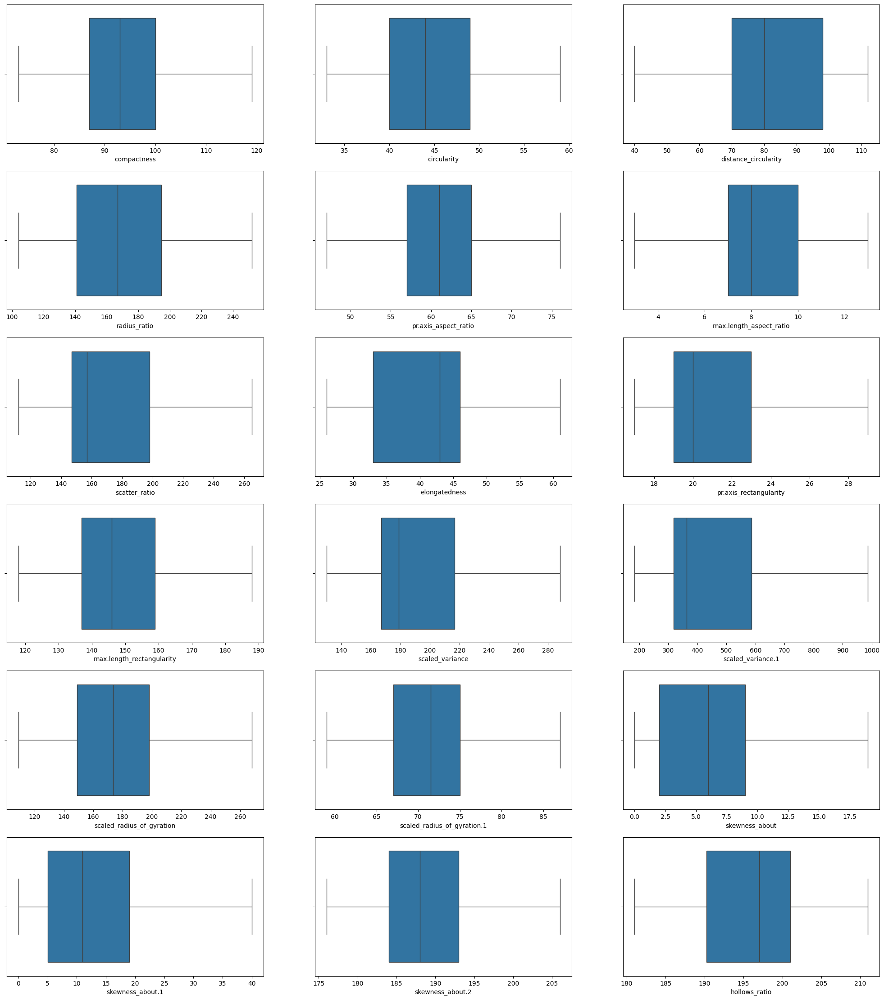

In [23]:
plt.figure(figsize = (25,28))
col = 1
for i in df.drop(columns = 'class').columns:
    plt.subplot(6,3,col)
    sns.boxplot(df[i], orient = 'h')
    col += 1

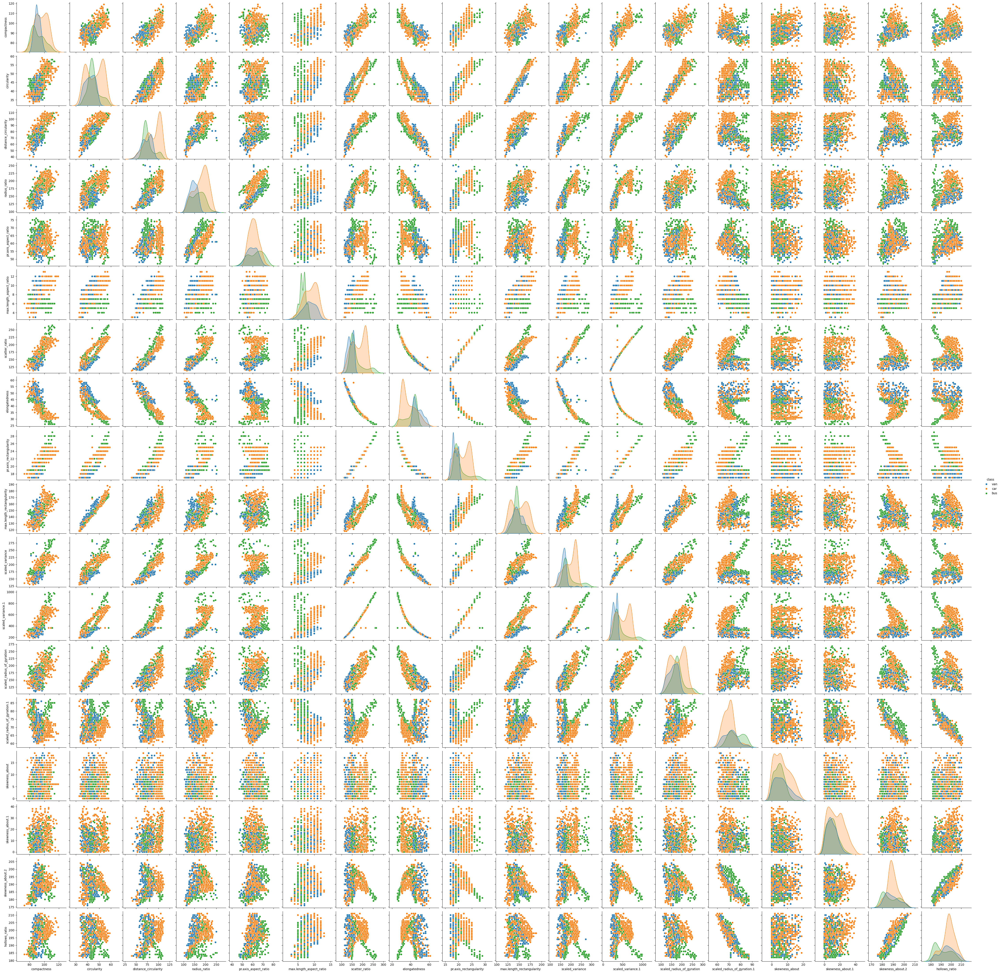

In [24]:
sns.pairplot(data = df, diag_kind = 'kde', hue = 'class')

In [25]:
df['class'].isna().sum()

0

In [26]:
df['class'] = pd.Categorical(df['class'])

In [27]:
df.dtypes

compactness                       int64
circularity                     float64
distance_circularity            float64
radius_ratio                    float64
pr.axis_aspect_ratio            float64
max.length_aspect_ratio           int64
scatter_ratio                   float64
elongatedness                   float64
pr.axis_rectangularity          float64
max.length_rectangularity         int64
scaled_variance                 float64
scaled_variance.1               float64
scaled_radius_of_gyration       float64
scaled_radius_of_gyration.1     float64
skewness_about                  float64
skewness_about.1                float64
skewness_about.2                float64
hollows_ratio                     int64
class                          category
dtype: object

In [28]:
df['class'] = df['class'].replace({'van': '1', 'bus': '2', 'car': '3'})

In [29]:
df['class'].head()

0    1
1    1
2    3
3    1
4    2
Name: class, dtype: category
Categories (3, object): ['2', '3', '1']

In [30]:
corr = df.corr()
corr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.684887,0.789928,0.721925,0.192864,0.499928,0.812620,-0.788750,0.813694,0.676143,0.769871,0.806170,0.585243,-0.246681,0.197308,0.156348,0.298537,0.365552,0.297774
circularity,0.684887,1.000000,0.792320,0.638280,0.203253,0.560470,0.847938,-0.821472,0.843400,0.961318,0.802768,0.827462,0.925816,0.068745,0.136351,-0.009666,-0.104426,0.046351,0.251281
distance_circularity,0.789928,0.792320,1.000000,0.794222,0.244332,0.666809,0.905076,-0.911307,0.893025,0.774527,0.869584,0.883943,0.705771,-0.229353,0.099107,0.262345,0.146098,0.332732,0.428523
radius_ratio,0.721925,0.638280,0.794222,1.000000,0.650554,0.463958,0.769941,-0.825392,0.744139,0.579468,0.786183,0.760257,0.550774,-0.390459,0.035755,0.179601,0.405849,0.491758,0.444101
pr.axis_aspect_ratio,0.192864,0.203253,0.244332,0.650554,1.000000,0.150295,0.194195,-0.298144,0.163047,0.147592,0.207101,0.196401,0.148591,-0.321070,-0.056030,-0.021088,0.400882,0.415734,0.062981
max.length_aspect_ratio,0.499928,0.560470,0.666809,0.463958,0.150295,1.000000,0.490759,-0.504181,0.487931,0.642713,0.401391,0.463249,0.397397,-0.335444,0.081898,0.141664,0.083794,0.413174,0.167375
scatter_ratio,0.812620,0.847938,0.905076,0.769941,0.194195,0.490759,1.000000,-0.971601,0.989751,0.809083,0.960883,0.980447,0.799875,0.011314,0.064242,0.211647,0.005628,0.118817,0.463566
elongatedness,-0.788750,-0.821472,-0.911307,-0.825392,-0.298144,-0.504181,-0.971601,1.000000,-0.948996,-0.775854,-0.947644,-0.948851,-0.766314,0.078391,-0.046943,-0.183642,-0.115126,-0.216905,-0.483027
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.744139,0.163047,0.487931,0.989751,-0.948996,1.000000,0.810934,0.947329,0.973606,0.796690,0.027545,0.073127,0.213801,-0.018649,0.099286,0.444586
max.length_rectangularity,0.676143,0.961318,0.774527,0.579468,0.147592,0.642713,0.809083,-0.775854,0.810934,1.000000,0.750222,0.789632,0.866450,0.053856,0.130702,0.004129,-0.103948,0.076770,0.140152


<Axes: title={'center': 'Correlation HeatMap'}>

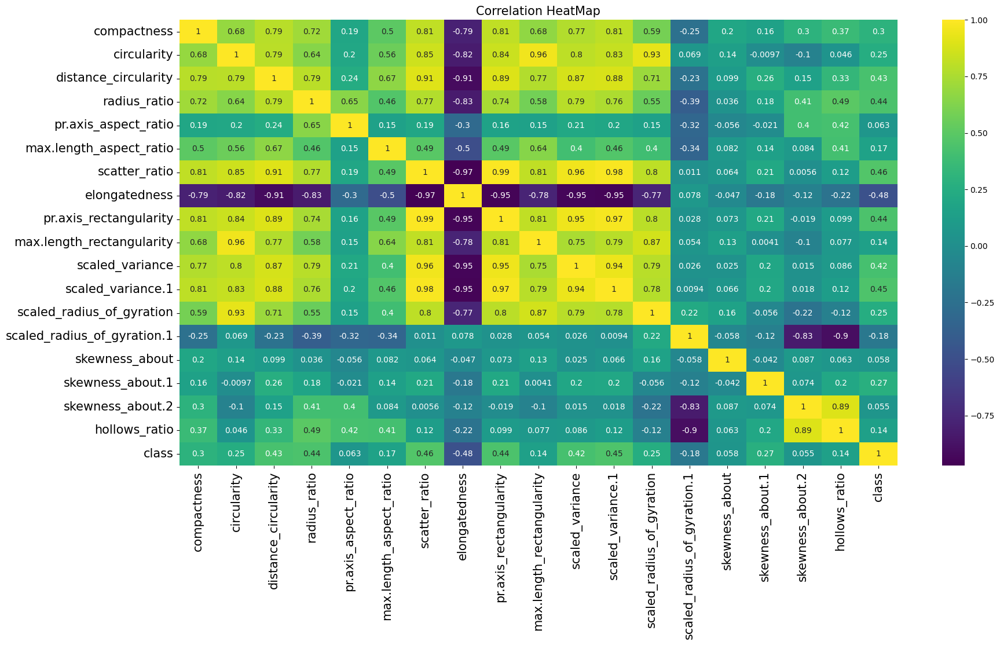

In [31]:
plt.figure(figsize = (20, 10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Correlation HeatMap', fontsize = 15)
sns.heatmap(corr, annot = True, cmap = 'viridis')

In [32]:
df.dtypes

compactness                       int64
circularity                     float64
distance_circularity            float64
radius_ratio                    float64
pr.axis_aspect_ratio            float64
max.length_aspect_ratio           int64
scatter_ratio                   float64
elongatedness                   float64
pr.axis_rectangularity          float64
max.length_rectangularity         int64
scaled_variance                 float64
scaled_variance.1               float64
scaled_radius_of_gyration       float64
scaled_radius_of_gyration.1     float64
skewness_about                  float64
skewness_about.1                float64
skewness_about.2                float64
hollows_ratio                     int64
class                          category
dtype: object

In [33]:
df['class'] = df['class'].astype('object')

In [34]:
df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [35]:
df['class'].head()

0    1
1    1
2    3
3    1
4    2
Name: class, dtype: object

In [36]:
df['class'] = df['class'].replace({'1': 'van', '2': 'bus', '3': 'car'})
df['class'].head()

0    van
1    van
2    car
3    van
4    bus
Name: class, dtype: object

In [37]:
x = df.loc[:, df.columns != 'class']
y = df['class'].astype('category').cat.codes

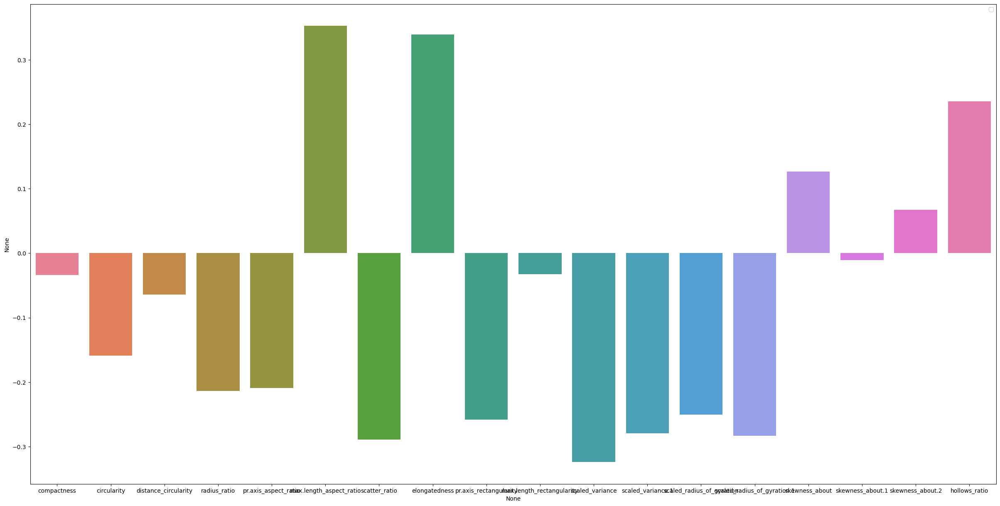

In [38]:
plt.figure(figsize = (30,15))
sns.barplot(x = x.columns, y = x.corrwith(y), palette = 'husl')
plt.legend()
plt.show()

In [39]:
x_col = x.columns
scaler = RobustScaler()
x_std = pd.DataFrame(scaler.fit_transform(x))
x_std.columns = x_col
x_std.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.153846,0.444444,0.107143,0.204651,1.375,0.666667,0.098039,-0.076923,0.00,0.590909,-0.060302,0.057890,0.214286,-0.1875,0.000000,0.357143,-0.111111,0.000000
1,-0.153846,-0.333333,0.142857,-0.483721,-0.500,0.333333,-0.156863,0.153846,-0.25,-0.136364,-0.180905,-0.125117,-0.316327,0.0625,0.428571,0.214286,0.111111,0.186047
2,0.846154,0.666667,0.928571,0.781395,0.625,0.666667,0.980392,-0.846154,0.75,0.545455,0.884422,1.014006,0.948980,0.1875,1.142857,-0.142857,0.000000,-0.093023
3,0.000000,-0.333333,0.071429,-0.148837,0.250,0.333333,-0.254902,0.230769,-0.25,-0.136364,-0.381910,-0.203548,-0.948980,-1.0625,0.000000,-0.071429,1.222222,0.930233
4,-0.615385,0.000000,-0.357143,0.706977,0.000,0.000000,-0.156863,0.153846,-0.25,-0.090909,1.246231,-0.143791,0.295918,0.0000,0.428571,0.000000,-0.888889,-1.302326


Text(0, 0.5, 'Percentage of Cumulative Explained Variance')

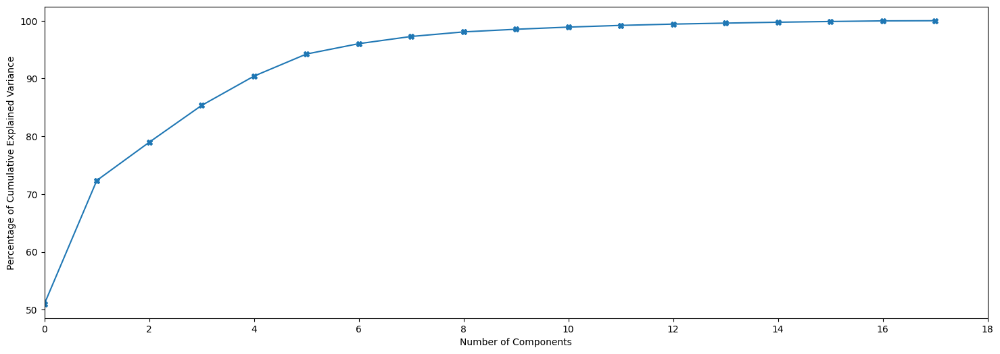

In [40]:
pca = PCA()
x_pca = pca.fit_transform(x_std)

plt.figure(figsize = (18,6))
plt.plot((np.cumsum(pca.explained_variance_ratio_) * 100), marker = 'X')
plt.xlim(0,18)
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Cumulative Explained Variance')

Text(0.5, 1.0, 'Vehicle Dataset Explained Variance')

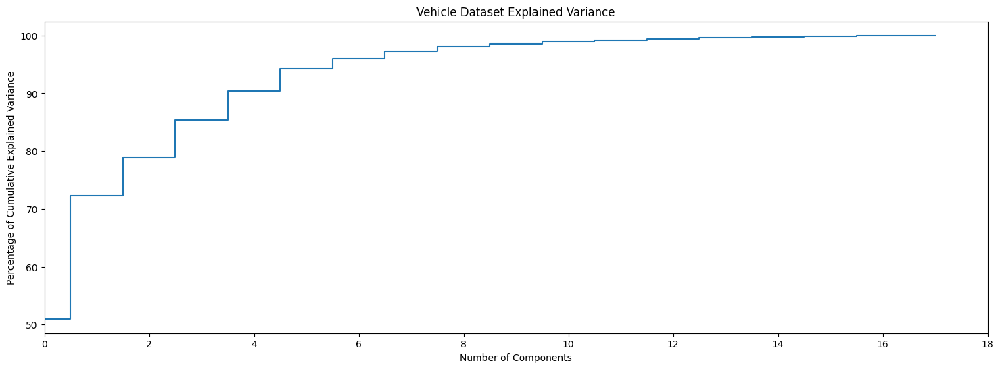

In [41]:
plt.figure(figsize=(18,6))
plt.step(list(range(18)), (np.cumsum(pca.explained_variance_ratio_)) * 100, where = 'mid')
plt.xlim(0, 18)
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Cumulative Explained Variance')
plt.title('Vehicle Dataset Explained Variance')

In [42]:
print("Eigen valuse\n")
pca.explained_variance_

Eigen valuse



array([3.96100935e+00, 1.65870806e+00, 5.13125294e-01, 4.94835514e-01,
       3.94116009e-01, 2.96614528e-01, 1.39542157e-01, 9.65854893e-02,
       6.14513508e-02, 3.54768843e-02, 2.88836973e-02, 2.31031113e-02,
       1.73160148e-02, 1.31973434e-02, 1.21370214e-02, 9.51277726e-03,
       8.47124019e-03, 2.15456314e-03])

In [43]:
print("Eigen Vectors\n")
pca.components_

Eigen Vectors



array([[ 2.70447593e-01,  3.08703426e-01,  2.65942302e-01,
         2.52585109e-01,  1.09214594e-01,  2.13874526e-01,
         3.15596351e-01, -2.89988322e-01,  3.10540787e-01,
         2.89929102e-01,  2.91291670e-01,  3.10633904e-01,
         2.75022976e-01, -5.33629155e-02,  3.81838626e-02,
         5.63034801e-02,  4.22027355e-02,  9.45420647e-02],
       [-7.47916800e-02,  1.26651078e-01, -3.48093808e-02,
        -1.62272484e-01, -2.48978101e-01, -1.08750428e-01,
         7.36512380e-02, -1.53458109e-02,  8.42168152e-02,
         1.13034088e-01,  7.29964089e-02,  7.02249862e-02,
         1.97981239e-01,  5.56982050e-01, -1.57637616e-02,
        -7.55602532e-02, -4.86108063e-01, -4.99531014e-01],
       [-1.18830485e-01, -5.87844882e-02, -6.00864271e-02,
         2.49637579e-01,  6.08795859e-01, -3.65061020e-01,
         4.64038791e-02, -9.41521128e-02,  2.21250572e-02,
        -1.41319498e-01,  1.17492762e-01,  5.55858661e-02,
        -7.03700592e-03,  1.66474566e-01, -5.67582188e

Text(0.5, 0, 'Principal Components')

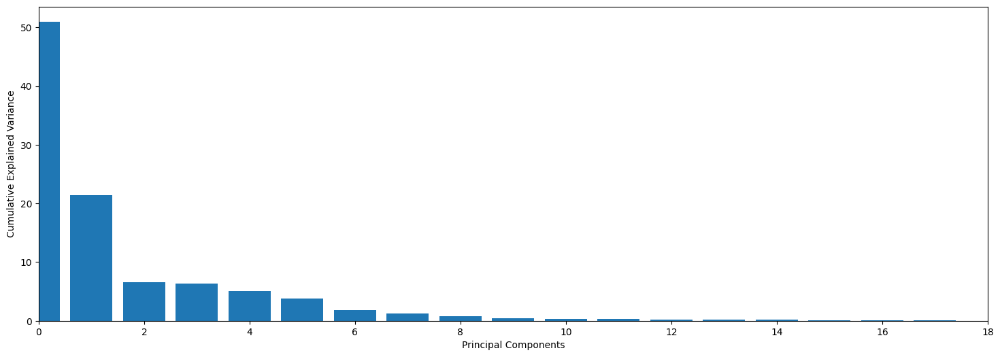

In [44]:
percent_var = np.round(pca.explained_variance_ratio_ * 100, decimals = 2)

plt.figure(figsize = (18,6))
plt.bar(list(range(18)), height = percent_var)
plt.xlim(0, 18)
plt.ylabel('Cumulative Explained Variance')
plt.xlabel('Principal Components')

Text(0.5, 0, 'Principal Components')

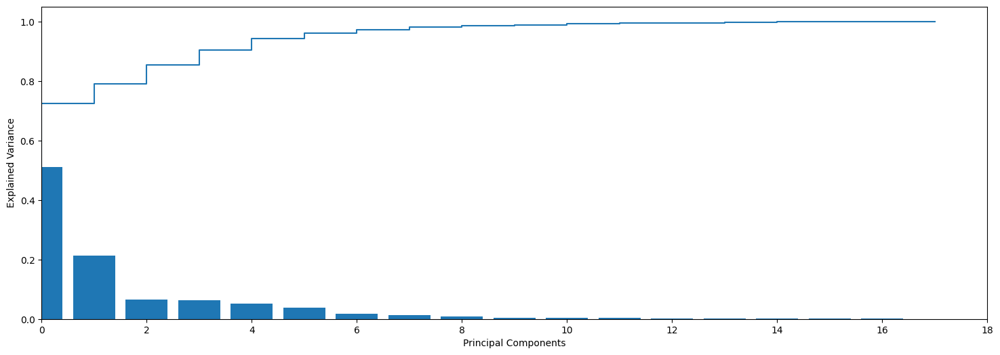

In [45]:
plt.figure(figsize = (18,6))
plt.step(range(18), np.cumsum(pca.explained_variance_ratio_))
plt.bar(range(18), pca.explained_variance_ratio_)
plt.xlim(0, 18)
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')

Text(0.5, 0, 'Principal Components')

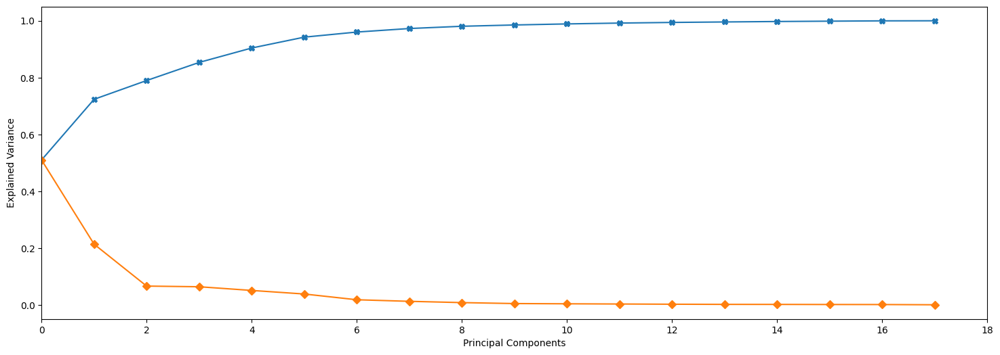

In [46]:
plt.figure(figsize=(18,6))
plt.plot(range(18), np.cumsum(pca.explained_variance_ratio_), marker = 'X')
plt.plot(range(18), pca.explained_variance_ratio_, marker = 'D')
plt.xlim(0, 18)
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')

In [47]:
pca_7 = PCA(n_components = 7)
x_pca = pca_7.fit_transform(x_std)

print('Original number of features:', x.shape[1])
print('Reduced number of features:', x_pca.shape[1])

Original number of features: 18
Reduced number of features: 7


In [48]:
df_new = pd.DataFrame(data = x_pca)
df_new.head()

,0,1,2,3,4,5,6
0,0.446376,-0.475441,0.415578,-0.591180,-0.628784,-1.166228,-0.141708
1,-0.969205,-0.247348,-0.860688,0.132533,-0.118024,-0.153620,0.121625
2,2.471311,0.202940,-0.292011,-0.761633,0.598456,-0.485311,0.517424
3,-0.945422,-2.161404,-0.350315,-0.148290,-0.333014,0.219506,0.096389
4,-0.440204,1.005528,0.217450,-0.347911,0.147644,-0.579934,0.214694


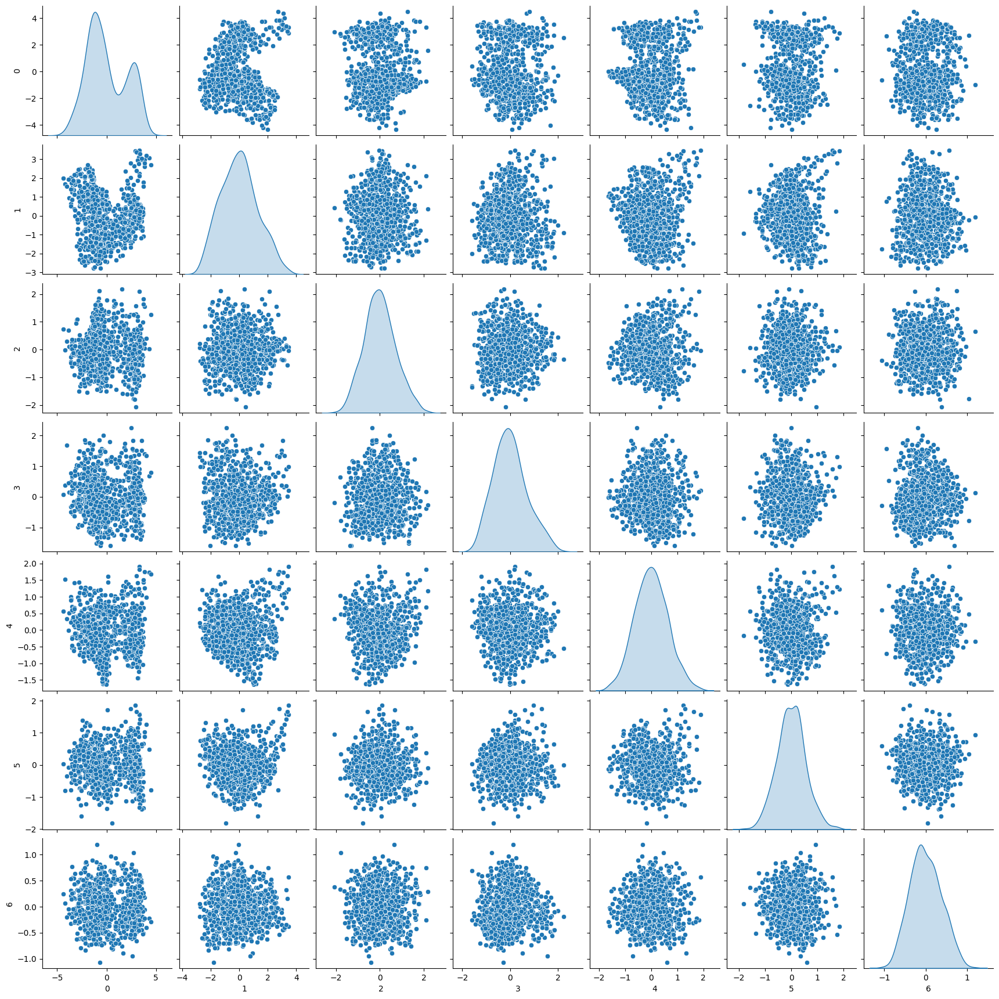

In [49]:
sns.pairplot(df_new, diag_kind = 'kde')

# With PCA

In [51]:
x_tr, x_te, y_tr, y_te = train_test_split(x_pca, y, random_state = 10, test_size = 0.3)

In [52]:
x_tr.shape

(592, 7)

In [53]:
x_te.shape

(254, 7)

# Without PCA

In [55]:
x_train, x_test, y_train, y_test = train_test_split(x_std, y, random_state = 10, test_size = 0.3)

In [56]:
x_train.shape

(592, 18)

In [57]:
x_test.shape

(254, 18)

# SVC model with PCA

SVC Model of dataset with PCA

Accuracy Score of Training Data:  0.839527027027027

Accuracy Score of Test Data: 0.8543307086614174

Classification Report

               precision    recall  f1-score   support

           0       0.81      0.86      0.84        71
           1       0.92      0.83      0.87       125
           2       0.79      0.90      0.84        58

    accuracy                           0.85       254
   macro avg       0.84      0.86      0.85       254
weighted avg       0.86      0.85      0.86       254


Mean absolute error: 

 0.1732283464566929

Confusion matrix

 [[ 61   7   3]
 [ 10 104  11]
 [  4   2  52]]


Text(0.5, 1.0, 'Confusion Matrix HeatMap of SVC with PCA Model')

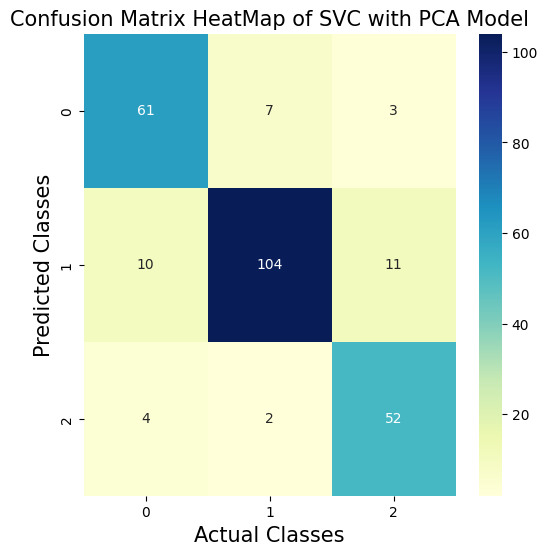

In [59]:
svc_pca = SVC(kernel = 'linear', gamma = 'scale', C = 1)
print('SVC Model of dataset with PCA')

svc_pca.fit(x_tr, y_tr)
y_true = y_te
y_pred = svc_pca.predict(x_te)

svc_pca_tr_score = svc_pca.score(x_tr, y_tr)
svc_pca_score = svc_pca.score(x_te, y_te)

print('\nAccuracy Score of Training Data: ', svc_pca_tr_score)
print('\nAccuracy Score of Test Data:', svc_pca_score)

cfm_svc_pca = confusion_matrix(y_true, y_pred)
acc_svc_pca = accuracy_score(y_true, y_pred)

print("\nClassification Report\n\n", classification_report(y_true, y_pred))
print("\nMean absolute error: \n\n", mean_absolute_error(y_true, y_pred))
print("\nConfusion matrix\n\n", cfm_svc_pca)

plt.figure(figsize = (6,6))
sns.heatmap(cfm_svc_pca, annot = True, cmap = 'YlGnBu', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix HeatMap of SVC with PCA Model', fontsize = 15)

In [60]:
precision_svc_pca, recall_svc_pca,f1_score_svc_pca, support = precision_recall_fscore_support(y_test, y_pred, average = 'macro')
print("Precision score: ",'%.2f' % precision_svc_pca)
print("Recall score: ",'%.2f' % recall_svc_pca)
print("F1 score: ",'%.2f' % f1_score_svc_pca)
print("Accuracy score: ",'%.2f' % acc_svc_pca)

Precision score:  0.84
Recall score:  0.86
F1 score:  0.85
Accuracy score:  0.85


# Without PCA

SVC Model of dataset without PCA

Accuracy Score of Training Data:  0.9425675675675675

Accuracy Score of Test Data: 0.9448818897637795

Classification Report

               precision    recall  f1-score   support

           0       0.94      0.94      0.94        71
           1       0.97      0.93      0.95       125
           2       0.90      0.98      0.94        58

    accuracy                           0.94       254
   macro avg       0.94      0.95      0.94       254
weighted avg       0.95      0.94      0.94       254


Mean absolute error: 

 0.05905511811023622

Confusion matrix

 [[ 67   3   1]
 [  4 116   5]
 [  0   1  57]]


Text(0.5, 1.0, 'Confusion Matrix HeatMap of SVC without PCA Model')

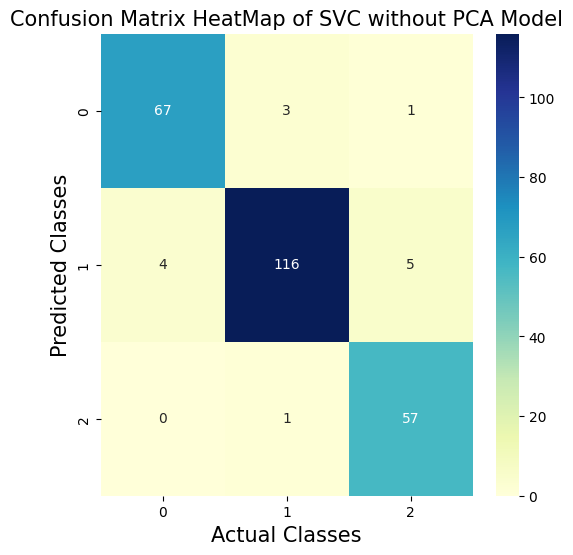

In [62]:
svc = SVC(kernel = 'linear', gamma = 'scale', C = 1)
print('SVC Model of dataset without PCA')

svc.fit(x_train, y_train)
y_true = y_test
y_pred = svc.predict(x_test)

svc_tr_score = svc.score(x_train, y_train)
svc_score = svc.score(x_test, y_test)

print('\nAccuracy Score of Training Data: ', svc_tr_score)
print('\nAccuracy Score of Test Data:', svc_score)

cfm_svc = confusion_matrix(y_true, y_pred)
acc_svc = accuracy_score(y_true, y_pred)

print("\nClassification Report\n\n", classification_report(y_true, y_pred))
print("\nMean absolute error: \n\n", mean_absolute_error(y_true, y_pred))
print("\nConfusion matrix\n\n", cfm_svc)

plt.figure(figsize = (6,6))
sns.heatmap(cfm_svc, annot = True, cmap = 'YlGnBu', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix HeatMap of SVC without PCA Model', fontsize = 15)

In [63]:
precision_svc, recall_svc,f1_score_svc, support = precision_recall_fscore_support(y_test, y_pred, average = 'macro')
print("Precision score: ",'%.2f' % precision_svc)
print("Recall score: ",'%.2f' % recall_svc)
print("F1 score: ",'%.2f' % f1_score_svc)
print("Accuracy score: ",'%.2f' % acc_svc)

Precision score:  0.94
Recall score:  0.95
F1 score:  0.94
Accuracy score:  0.94


In [64]:
mdl = []
mdl.append(['Support Vector Classifier with PCA', svc_pca_tr_score * 100, svc_pca_score * 100, recall_svc_pca * 100, precision_svc_pca * 100])
mdl.append(['Support Vector Classifier without PCA', svc_tr_score * 100, svc_pca_score * 100, recall_svc * 100, precision_svc * 100])
mdl_df = pd.DataFrame(mdl, columns = ['Model', 'Training Accuracy', 'Testing Accuracy', 'Recall Score', 'Precision Score'])
mdl_df

,Model,Training Accuracy,Testing Accuracy,Recall Score,Precision Score
0,Support Vector Classifier with PCA,83.952703,85.433071,86.256888,84.052203
1,Support Vector Classifier without PCA,94.256757,85.433071,95.147353,93.836351


# Grid search

# With PCA

In [67]:
param_grid_pca = [{'kernel': ['rbf'], 'C': [0.01, 0.05, 0.5, 1]},
                 {'kernel': ['linear'], 'C': [0.01, 0.05, 0.5, 1]}]

clf_grid_pca = GridSearchCV(SVC(), param_grid_pca, verbose = 1)

clf_grid_pca.fit(x_tr, y_tr)

print('\n\nBest Parameters:\n', clf_grid_pca.best_params_)
print('\n\nBest Estimators:\n', clf_grid_pca.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


Best Parameters:
 {'C': 1, 'kernel': 'rbf'}


Best Estimators:
 SVC(C=1)


SVC Model of dataset with PCA

Accuracy Score of Training Data:  0.9375

Accuracy Score of Test Data: 0.9133858267716536

Classification Report

               precision    recall  f1-score   support

           0       0.97      0.96      0.96        71
           1       0.93      0.90      0.92       125
           2       0.81      0.88      0.84        58

    accuracy                           0.91       254
   macro avg       0.90      0.91      0.91       254
weighted avg       0.92      0.91      0.91       254


Mean absolute error: 

 0.09448818897637795

Confusion matrix

 [[ 68   2   1]
 [  1 113  11]
 [  1   6  51]]


Text(0.5, 1.0, 'Confusion Matrix HeatMap of SVC with Grid Search with PCA Model')

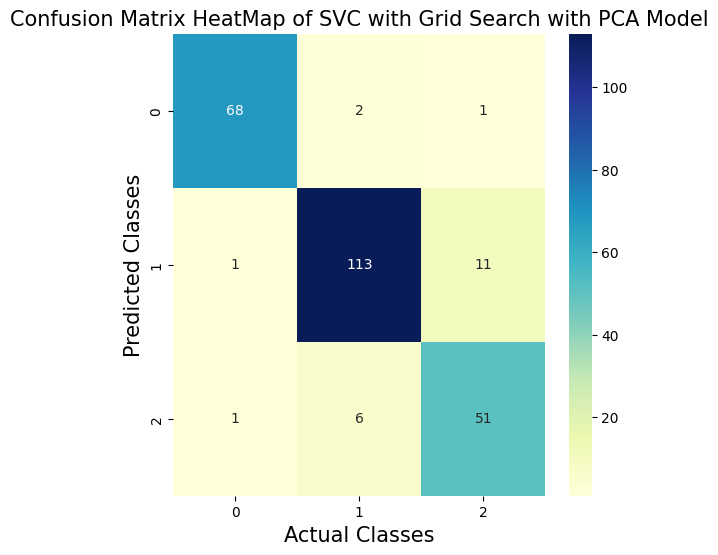

In [68]:
svc_pca_cv = SVC(kernel = 'rbf', gamma = 'scale', C = 1)
print('SVC Model of dataset with PCA')

svc_pca_cv.fit(x_tr, y_tr)
y_true = y_te
y_pred = svc_pca_cv.predict(x_te)

svc_pca_cv_tr_score = svc_pca_cv.score(x_tr, y_tr)
svc_pca_cv_score = svc_pca_cv.score(x_te, y_te)

print('\nAccuracy Score of Training Data: ', svc_pca_cv_tr_score)
print('\nAccuracy Score of Test Data:', svc_pca_cv_score)

cfm_svc_pca_cv = confusion_matrix(y_true, y_pred)
acc_svc_pca_cv = accuracy_score(y_true, y_pred)

print("\nClassification Report\n\n", classification_report(y_true, y_pred))
print("\nMean absolute error: \n\n", mean_absolute_error(y_true, y_pred))
print("\nConfusion matrix\n\n", cfm_svc_pca_cv)

plt.figure(figsize = (6,6))
sns.heatmap(cfm_svc_pca_cv, annot = True, cmap = 'YlGnBu', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix HeatMap of SVC with Grid Search with PCA Model', fontsize = 15)

In [69]:
precision_svc_pca_cv, recall_svc_pca_cv, f1_score_svc_pca_cv, support = precision_recall_fscore_support(y_test, y_pred, average = 'macro')
print("Precision score: ",'%.2f' % precision_svc_pca_cv)
print("Recall score: ",'%.2f' % recall_svc_pca_cv)
print("F1 score: ",'%.2f' % f1_score_svc_pca_cv)
print("Accuracy score: ",'%.2f' % acc_svc_pca_cv)

Precision score:  0.90
Recall score:  0.91
F1 score:  0.91
Accuracy score:  0.91


# Without PCA

In [71]:
param_grid = [{'kernel': ['rbf'], 'C': [0.01, 0.05, 0.5, 1]},
                 {'kernel': ['linear'], 'C': [0.01, 0.05, 0.5, 1]}]

clf_grid = GridSearchCV(SVC(), param_grid, verbose = 1)

clf_grid.fit(x_train, y_train)

print('\n\nBest Parameters:\n', clf_grid.best_params_)
print('\n\nBest Estimators:\n', clf_grid.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


Best Parameters:
 {'C': 1, 'kernel': 'rbf'}


Best Estimators:
 SVC(C=1)



Accuracy Score of Training Data:  0.9662162162162162

Accuracy Score of Test Data: 0.9606299212598425

Classification Report

               precision    recall  f1-score   support

           0       0.99      0.99      0.99        71
           1       0.98      0.96      0.97       125
           2       0.90      0.93      0.92        58

    accuracy                           0.96       254
   macro avg       0.95      0.96      0.96       254
weighted avg       0.96      0.96      0.96       254


Mean absolute error: 

 0.047244094488188976

Confusion matrix

 [[ 70   0   1]
 [  0 120   5]
 [  1   3  54]]


Text(0.5, 1.0, 'Confusion Matrix HeatMap of SVC with Grid Search without PCA Model')

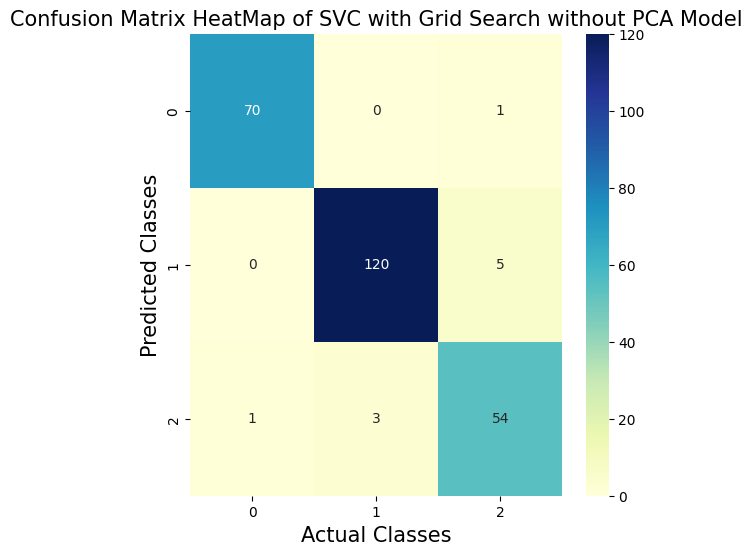

In [72]:
svc_cv = SVC(kernel = 'rbf', C = 1, gamma = 'scale')
svc_cv.fit(x_train, y_train)

svc_cv_tr_score = svc_cv.score(x_train, y_train)
svc_cv_score = svc_cv.score(x_test, y_test)

print('\nAccuracy Score of Training Data: ', svc_cv_tr_score)
print('\nAccuracy Score of Test Data:', svc_cv_score)

y_true = y_test
y_pred = svc_cv.predict(x_test)

cfm_svc_cv = confusion_matrix(y_true, y_pred)
acc_svc_cv = accuracy_score(y_true, y_pred)

print("\nClassification Report\n\n", classification_report(y_true, y_pred))
print("\nMean absolute error: \n\n", mean_absolute_error(y_true, y_pred))
print("\nConfusion matrix\n\n", cfm_svc_cv)

plt.figure(figsize = (6,6))
sns.heatmap(cfm_svc_cv, annot = True, cmap = 'YlGnBu', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix HeatMap of SVC with Grid Search without PCA Model', fontsize = 15)

In [73]:
precision_svc_cv, recall_svc_cv, f1_score_svc_cv, support = precision_recall_fscore_support(y_test, y_pred, average = 'macro')
print("Precision score: ",'%.2f' % precision_svc_cv)
print("Recall score: ",'%.2f' % recall_svc_cv)
print("F1 score: ",'%.2f' % f1_score_svc_cv)
print("Accuracy score: ",'%.2f' % acc_svc_cv)

Precision score:  0.95
Recall score:  0.96
F1 score:  0.96
Accuracy score:  0.96


In [74]:
mdl = []
mdl.append(['Support Vector Classifier with Grid Search with PCA', svc_pca_cv_tr_score * 100, svc_pca_cv_score * 100, recall_svc_pca_cv * 100, precision_svc * 100])
mdl.append(['Support Vector Classifier with Grid Search without PCA', svc_cv_tr_score * 100, svc_cv_score * 100, recall_svc_cv * 100, precision_svc_cv * 100])
mdl_df = pd.DataFrame(mdl, columns = ['Model', 'Training Accuracy', 'Testing Accuracy', 'Recall Score', 'Precision Score'])
mdl_df

,Model,Training Accuracy,Testing Accuracy,Recall Score,Precision Score
0,Support Vector Classifier with Grid Search wit...,93.750000,91.338583,91.368561,93.836351
1,Support Vector Classifier with Grid Search wit...,96.621622,96.062992,95.898333,95.384175


In [75]:
model = []
model.append(['Support Vector Classifier with PCA', svc_pca_tr_score * 100, svc_pca_score * 100, recall_svc_pca * 100, precision_svc_pca * 100])
model.append(['Support Vector Classifier without PCA', svc_tr_score * 100, svc_pca_score * 100, recall_svc * 100, precision_svc * 100])
model.append(['Support Vector Classifier with Grid Search with PCA', svc_pca_cv_tr_score * 100, svc_pca_cv_score * 100, recall_svc_pca_cv * 100, precision_svc * 100])
model.append(['Support Vector Classifier with Grid Search without PCA', svc_cv_tr_score * 100, svc_cv_score * 100, recall_svc_cv * 100, precision_svc_cv * 100])
model_df = pd.DataFrame(model, columns = ['Model', 'Training Accuracy', 'Testing Accuracy', 'Recall Score', 'Precision Score'])
model_df

,Model,Training Accuracy,Testing Accuracy,Recall Score,Precision Score
0,Support Vector Classifier with PCA,83.952703,85.433071,86.256888,84.052203
1,Support Vector Classifier without PCA,94.256757,85.433071,95.147353,93.836351
2,Support Vector Classifier with Grid Search wit...,93.750000,91.338583,91.368561,93.836351
3,Support Vector Classifier with Grid Search wit...,96.621622,96.062992,95.898333,95.384175


Text(0.5, 1.0, 'Comparison of Classification Models')

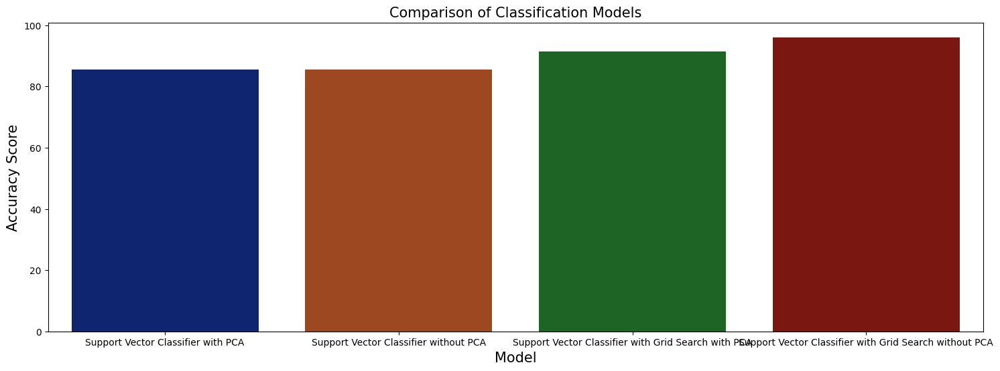

In [76]:
plt.figure(figsize = (18,6))
sns.barplot(x = model_df['Model'], y = model_df['Testing Accuracy'], data = model_df, palette = 'dark')
plt.xlabel('Model', fontsize = 15)
plt.ylabel('Accuracy Score', fontsize = 15)
plt.title('Comparison of Classification Models', fontsize = 15)